In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
data = pd.read_csv('/Users/krishnabarfiwala/Downloads/starcraft_player_data.csv')

In [3]:
data.head()

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,52,5,27,10,3000,143.7180,0.003515,0.000220,7,0.000110,0.000392,0.004849,32.6677,40.8673,4.7508,28,0.001397,6,0.0,0.000000
1,55,5,23,10,5000,129.2322,0.003304,0.000259,4,0.000294,0.000432,0.004307,32.9194,42.3454,4.8434,22,0.001193,5,0.0,0.000208
2,56,4,30,10,200,69.9612,0.001101,0.000336,4,0.000294,0.000461,0.002926,44.6475,75.3548,4.0430,22,0.000745,6,0.0,0.000189
3,57,3,19,20,400,107.6016,0.001034,0.000213,1,0.000053,0.000543,0.003783,29.2203,53.7352,4.9155,19,0.000426,7,0.0,0.000384
4,58,3,32,10,500,122.8908,0.001136,0.000327,2,0.000000,0.001329,0.002368,22.6885,62.0813,9.3740,15,0.001174,4,0.0,0.000019


In [4]:
data['GameID'].nunique(), data.shape

(3395, (3395, 20))

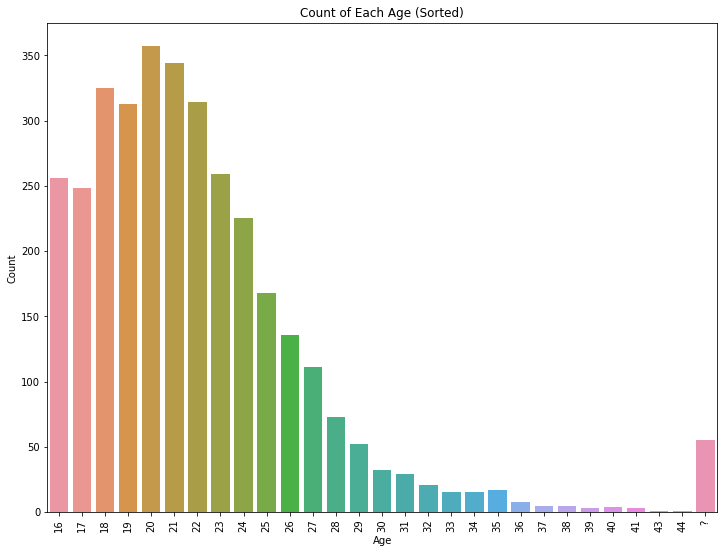

In [15]:
# plt.hist(data['Age'], bins=10, edgecolor='black')
# plt.xlabel('Age')
# plt.ylabel('Frequency')
# plt.title('Histogram of Age')
# plt.show()


age_counts = data['Age'].value_counts().sort_index()
plt.figure(figsize=(12, 9))
sns.barplot(x=age_counts.index, y=age_counts.values)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Count of Each Age (Sorted)')
plt.xticks(rotation=90)
plt.show()

In [5]:
data.isnull().sum()

GameID                  0
LeagueIndex             0
Age                     0
HoursPerWeek            0
TotalHours              0
APM                     0
SelectByHotkeys         0
AssignToHotkeys         0
UniqueHotkeys           0
MinimapAttacks          0
MinimapRightClicks      0
NumberOfPACs            0
GapBetweenPACs          0
ActionLatency           0
ActionsInPAC            0
TotalMapExplored        0
WorkersMade             0
UniqueUnitsMade         0
ComplexUnitsMade        0
ComplexAbilitiesUsed    0
dtype: int64

<Figure size 1080x720 with 0 Axes>

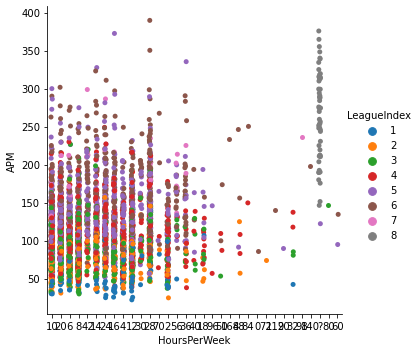

In [6]:
plt.figure(figsize=(15, 10))
sns.catplot(data=data, x="HoursPerWeek", y="APM", hue='LeagueIndex')
plt.show()

<AxesSubplot:xlabel='LeagueIndex', ylabel='WorkersMade'>

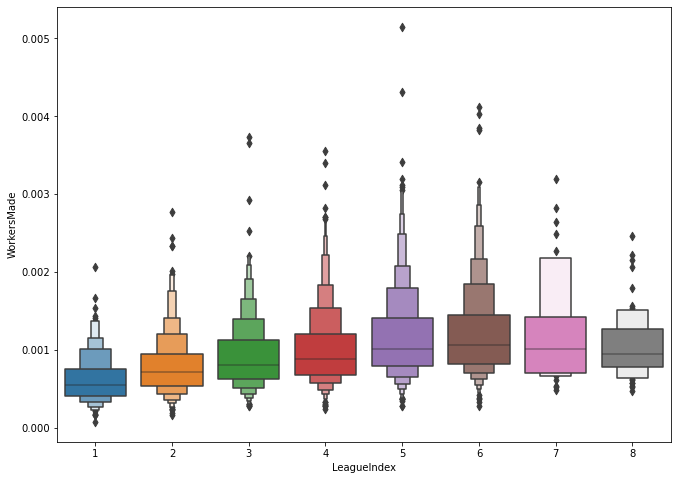

In [119]:
plt.figure(figsize=(11, 8))
sns.boxenplot(data=data, x="LeagueIndex", y="WorkersMade")

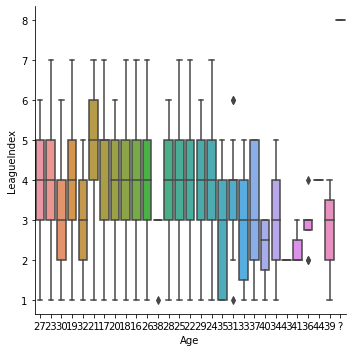

In [47]:
sns.catplot(data=data, x="Age", y='LeagueIndex', kind="box")      #can change the kind to boxen

In [51]:
'?' in data['TotalHours'].values, '?' in data['HoursPerWeek'].values, '?' in data['Age'].values

(True, True, True)

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3395 entries, 0 to 3394
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   GameID                3395 non-null   int64  
 1   LeagueIndex           3395 non-null   int64  
 2   Age                   3395 non-null   object 
 3   HoursPerWeek          3395 non-null   object 
 4   TotalHours            3395 non-null   object 
 5   APM                   3395 non-null   float64
 6   SelectByHotkeys       3395 non-null   float64
 7   AssignToHotkeys       3395 non-null   float64
 8   UniqueHotkeys         3395 non-null   int64  
 9   MinimapAttacks        3395 non-null   float64
 10  MinimapRightClicks    3395 non-null   float64
 11  NumberOfPACs          3395 non-null   float64
 12  GapBetweenPACs        3395 non-null   float64
 13  ActionLatency         3395 non-null   float64
 14  ActionsInPAC          3395 non-null   float64
 15  TotalMapExplored     

In [17]:
data['Age'] = data['Age'].replace('?', -1)
data['HoursPerWeek'] = data['HoursPerWeek'].replace('?', -1)
data['TotalHours'] = data['TotalHours'].replace('?',-1)

In [18]:
#convert dtype to int 
data['Age']= data['Age'].astype('int64')
data['HoursPerWeek']= data['HoursPerWeek'].astype('int64')
data['TotalHours']= data['TotalHours'].astype('int64')

In [19]:
data['Age']= data['Age'].replace(-1, data['Age'].mean())
data['HoursPerWeek']= data['HoursPerWeek'].replace(-1, data['HoursPerWeek'].mean())
data['TotalHours']= data['TotalHours'].replace(-1, data['TotalHours'].mean())

In [20]:
data.describe()

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
count,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000
mean,4805.012371,4.184094,21.641960,15.906151,960.150800,117.046947,0.004299,0.000374,4.364654,0.000098,0.000387,0.003463,40.361562,63.739403,5.272988,22.131664,0.001032,6.534021,0.000059,0.000142
std,2719.944851,1.517327,4.172377,11.863863,17172.094953,51.945291,0.005284,0.000225,2.360333,0.000166,0.000377,0.000992,17.153570,19.238869,1.494835,7.431719,0.000519,1.857697,0.000111,0.000265
min,52.000000,1.000000,16.000000,0.000000,3.000000,22.059600,0.000000,0.000000,0.000000,0.000000,0.000000,0.000679,6.666700,24.093600,2.038900,5.000000,0.000077,2.000000,0.000000,0.000000
25%,2464.500000,3.000000,19.000000,8.000000,300.000000,79.900200,0.001258,0.000204,3.000000,0.000000,0.000140,0.002754,28.957750,50.446600,4.272850,17.000000,0.000683,5.000000,0.000000,0.000000
50%,4874.000000,4.000000,21.000000,12.000000,500.000000,108.010200,0.002500,0.000353,4.000000,0.000040,0.000281,0.003395,36.723500,60.931800,5.095500,22.000000,0.000905,6.000000,0.000000,0.000020
75%,7108.500000,5.000000,24.000000,20.000000,800.000000,142.790400,0.005133,0.000499,6.000000,0.000119,0.000514,0.004027,48.290500,73.681300,6.033600,27.000000,0.001259,8.000000,0.000086,0.000181
max,10095.000000,8.000000,44.000000,168.000000,1000000.000000,389.831400,0.043088,0.001752,10.000000,0.003019,0.004041,0.007971,237.142900,176.372100,18.558100,58.000000,0.005149,13.000000,0.000902,0.003084


In [9]:
def plot_continuous_distribution(data: pd.DataFrame = None, column: str = None, height: int = 8):
  _ = sns.displot(data, x=column, kde=True, height=height, aspect=height/5).set(title=f'Distribution of {column}');

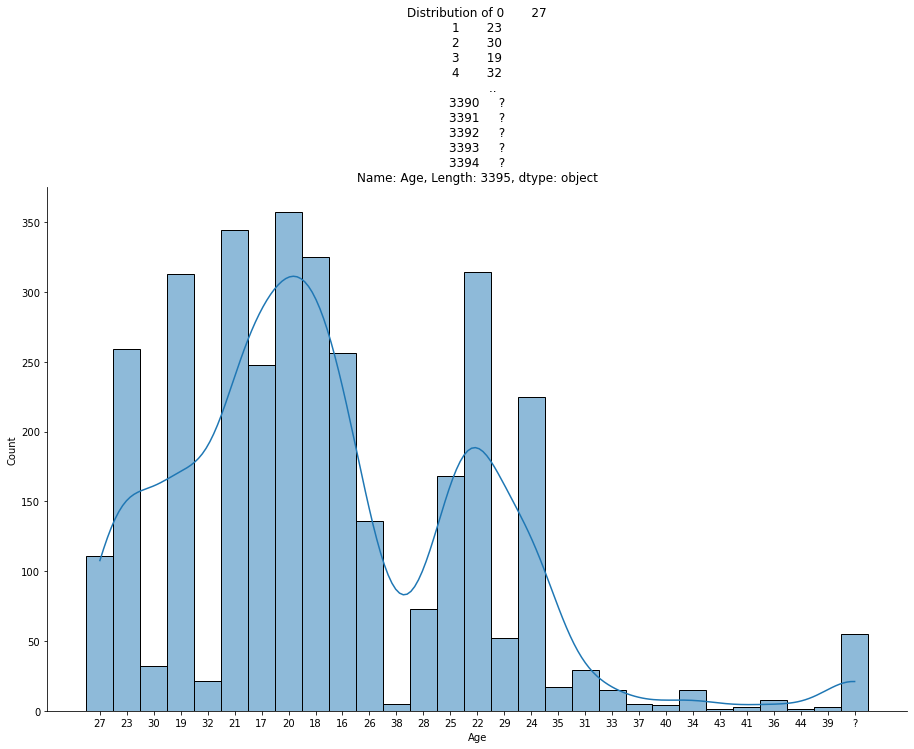

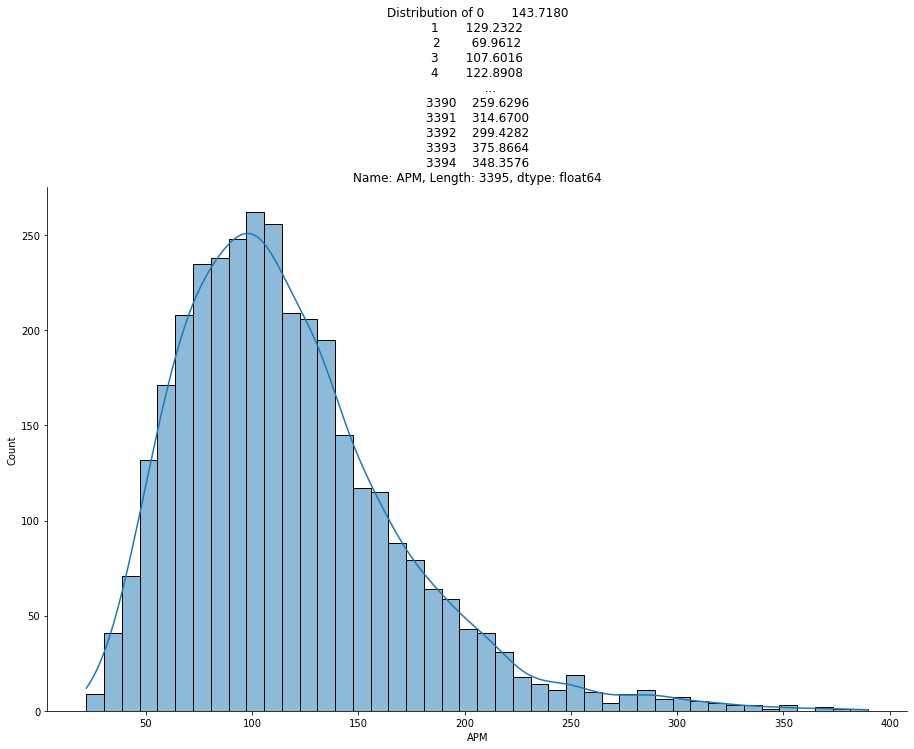

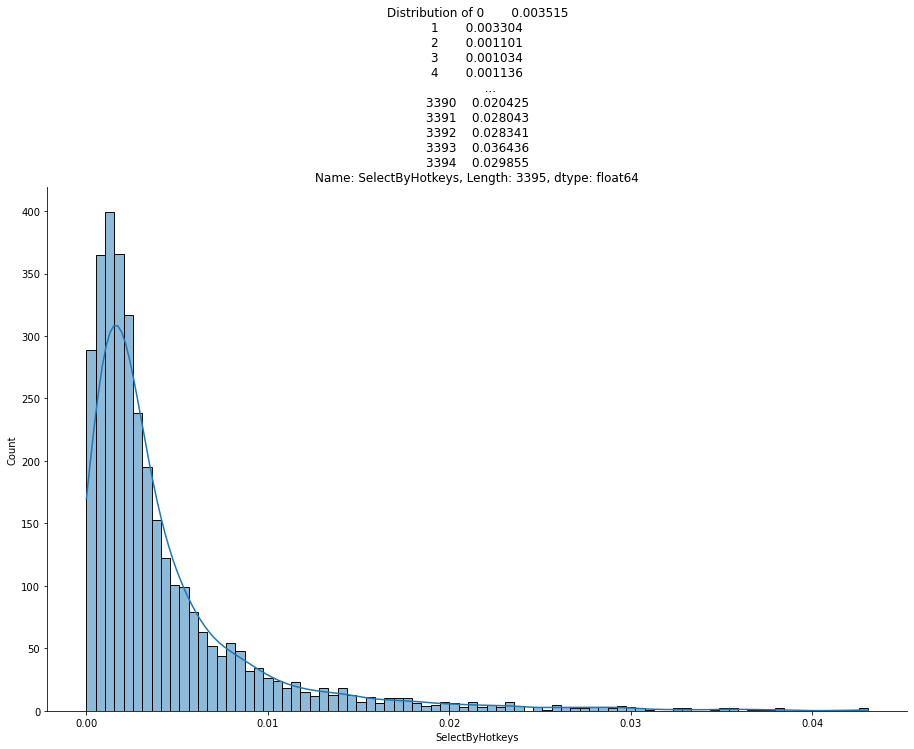

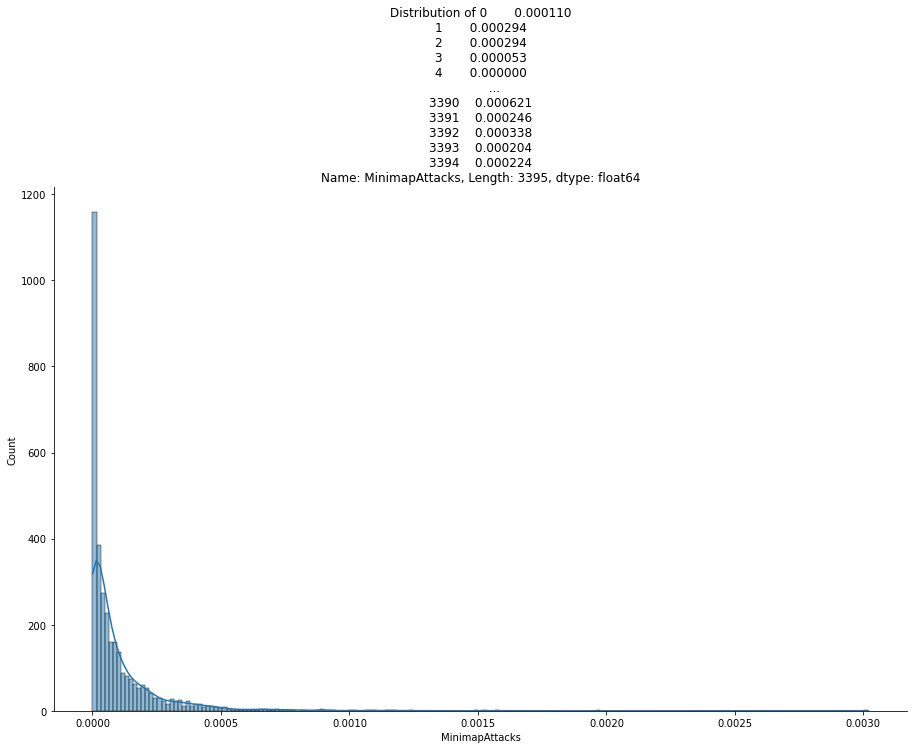

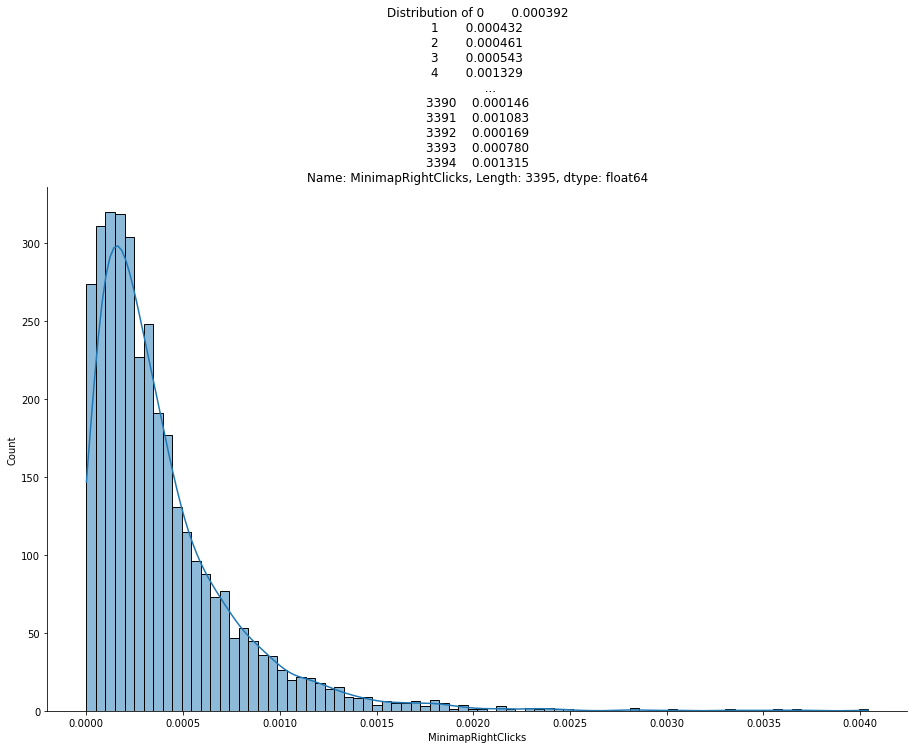

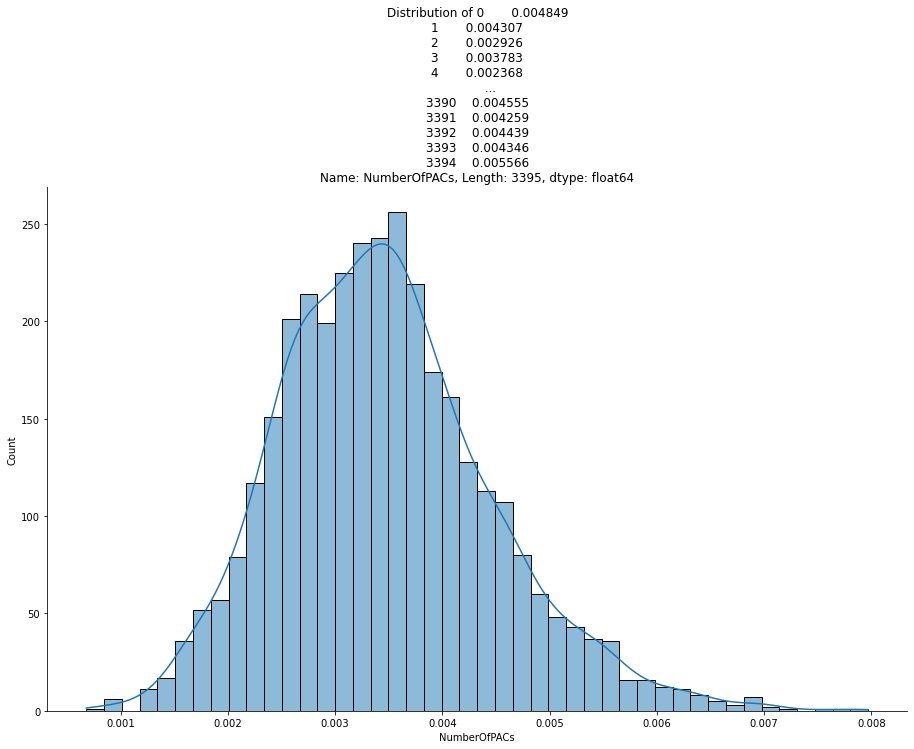

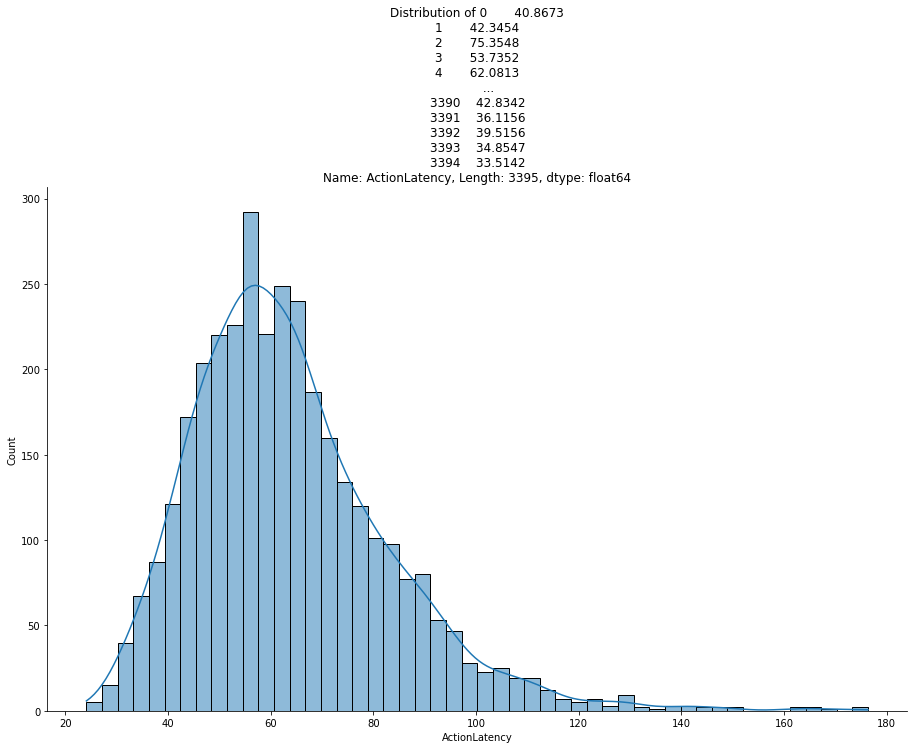

In [10]:
for column1 in [data.Age, data.APM, data.SelectByHotkeys, data.MinimapAttacks, data.MinimapRightClicks, 
                data.NumberOfPACs, data.ActionLatency ]:
  plot_continuous_distribution(data=data, column=column1)

Text(0.5, 1.0, 'correlation map')

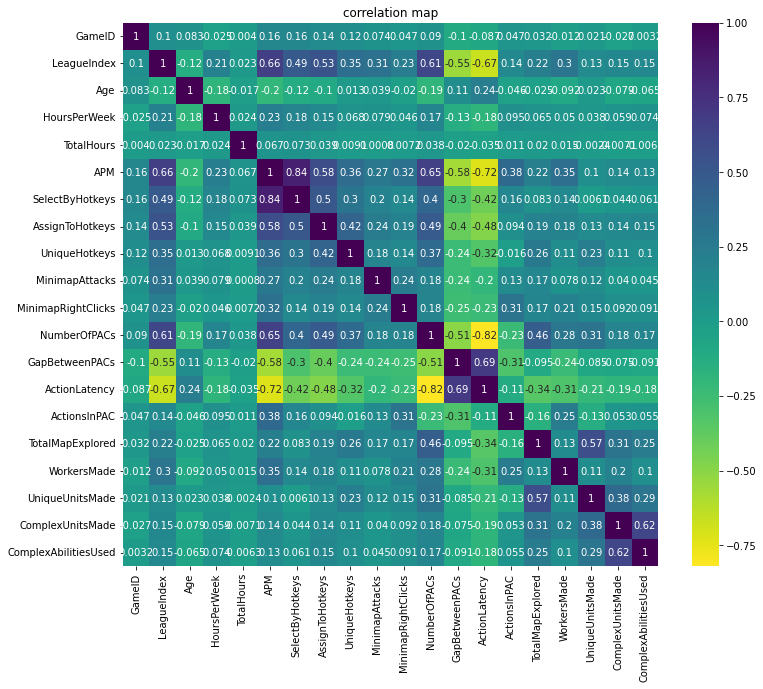

In [21]:
plt.figure(figsize=(12,10))
sns.heatmap(data.corr(),annot = True, cmap='viridis_r')
plt.title('correlation map')

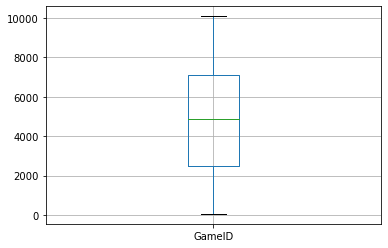

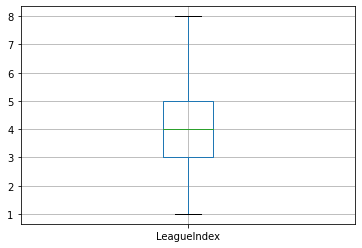

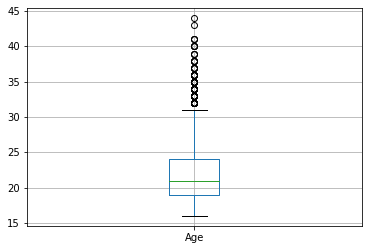

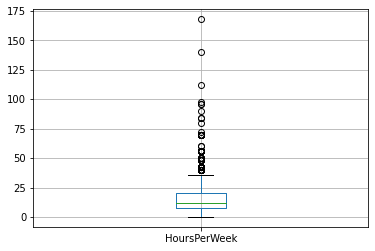

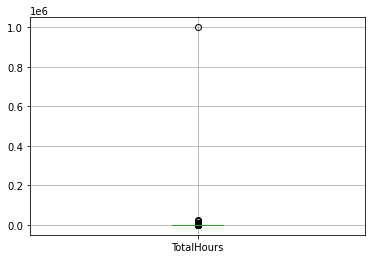

...

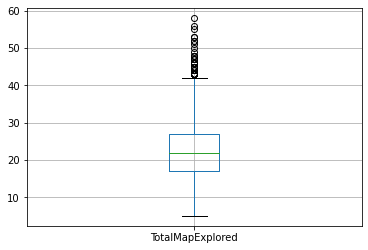

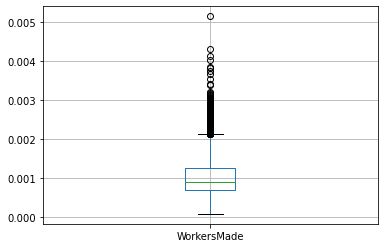

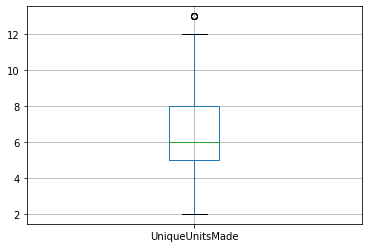

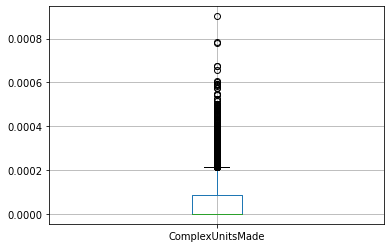

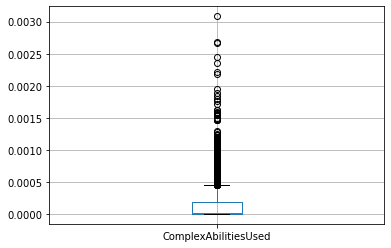

In [22]:
#Checking for outliers
for i in data.columns:
    data.boxplot(column=i)
    plt.show()


In [25]:
#This above graph shows some outliers for columns like: Age, HoursPerWeek, TotalHours, APM, SelectByHotkeys, 
# AssignToHotKeys,MinimapAttacks, MinimapRightclicks,NumberOfPACS, etc

In [23]:
column_name = 'HoursPerWeek'
# Find the index of the highest value in the column
max_index = data[column_name].idxmax()

# Print the modified DataFrame
print(data['HoursPerWeek'].max())

168.0


In [24]:
#removing rows where the hOURperweek > 130 since it is assumed to be impossible fpor any player to play sm 
##provided their league index is also at 6
#checked the max of each column and removed rows with hoursperweek>140
data = data[data['HoursPerWeek'] < 140]
data

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,52,5,27.000000,10.000000,3000.000000,143.7180,0.003515,0.000220,7,0.000110,0.000392,0.004849,32.6677,40.8673,4.7508,28,0.001397,6,0.000000,0.000000
1,55,5,23.000000,10.000000,5000.000000,129.2322,0.003304,0.000259,4,0.000294,0.000432,0.004307,32.9194,42.3454,4.8434,22,0.001193,5,0.000000,0.000208
2,56,4,30.000000,10.000000,200.000000,69.9612,0.001101,0.000336,4,0.000294,0.000461,0.002926,44.6475,75.3548,4.0430,22,0.000745,6,0.000000,0.000189
3,57,3,19.000000,20.000000,400.000000,107.6016,0.001034,0.000213,1,0.000053,0.000543,0.003783,29.2203,53.7352,4.9155,19,0.000426,7,0.000000,0.000384
4,58,3,32.000000,10.000000,500.000000,122.8908,0.001136,0.000327,2,0.000000,0.001329,0.002368,22.6885,62.0813,9.3740,15,0.001174,4,0.000000,0.000019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3390,10089,8,21.281001,15.631811,944.280118,259.6296,0.020425,0.000743,9,0.000621,0.000146,0.004555,18.6059,42.8342,6.2754,46,0.000877,5,0.000000,0.000000
3391,10090,8,21.281001,15.631811,944.280118,314.6700,0.028043,0.001157,10,0.000246,0.001083,0.004259,14.3023,36.1156,7.1965,16,0.000788,4,0.000000,0.000000
3392,10092,8,21.281001,15.631811,944.280118,299.4282,0.028341,0.000860,7,0.000338,0.000169,0.004439,12.4028,39.5156,6.3979,19,0.001260,4,0.000000,0.000000
3393,10094,8,21.281001,15.631811,944.280118,375.8664,0.036436,0.000594,5,0.000204,0.000780,0.004346,11.6910,34.8547,7.9615,15,0.000613,6,0.000000,0.000631


In [25]:
column_name = 'TotalHours'
# Find the index of the highest value in the column
max_index = data[column_name].idxmax()
# Print the modified DataFrame
print(data['TotalHours'].max())

1000000.0


In [41]:
data.describe()

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,...,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed,Totalhoursint
count,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,...,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000,3393.000000
mean,4805.835544,4.183024,21.643812,15.824751,959.814903,116.988890,0.004294,0.000373,4.363101,0.000098,...,0.003462,40.368969,63.752867,5.272531,22.122605,0.001032,6.531683,0.000059,0.000142,959.810197
std,2720.320157,1.517133,4.172467,11.378400,17177.149908,51.903707,0.005281,0.000225,2.359036,0.000166,...,0.000992,17.155829,19.236480,1.494978,7.423331,0.000519,1.855706,0.000111,0.000265,17177.149912
min,52.000000,1.000000,16.000000,0.000000,3.000000,22.059600,0.000000,0.000000,0.000000,0.000000,...,0.000679,6.666700,24.093600,2.038900,5.000000,0.000077,2.000000,0.000000,0.000000,3.000000
25%,2465.000000,3.000000,19.000000,8.000000,300.000000,79.827000,0.001258,0.000204,3.000000,0.000000,...,0.002753,28.965500,50.454900,4.272300,17.000000,0.000683,5.000000,0.000000,0.000000,300.000000
50%,4884.000000,4.000000,21.000000,12.000000,500.000000,108.002400,0.002497,0.000352,4.000000,0.000040,...,0.003395,36.731400,60.938900,5.094400,22.000000,0.000905,6.000000,0.000000,0.000020,500.000000
75%,7110.000000,5.000000,24.000000,20.000000,800.000000,142.767000,0.005117,0.000499,6.000000,0.000119,...,0.004025,48.290600,73.698300,6.033300,27.000000,0.001259,8.000000,0.000085,0.000180,800.000000
max,10095.000000,8.000000,44.000000,112.000000,1000000.000000,389.831400,0.043088,0.001752,10.000000,0.003019,...,0.007971,237.142900,176.372100,18.558100,58.000000,0.005149,13.000000,0.000902,0.003084,1000000.000000


In [56]:
data[data['TotalHours']>800]['TotalHours'].describe()

count        791.000000
mean        2704.211083
std        35534.751993
min          820.000000
25%         1000.000000
50%         1095.000000
75%         1500.000000
max      1000000.000000
Name: TotalHours, dtype: float64

In [32]:
max_value = data['TotalHours'].max()
# Remove rows with the maximum value
data= data[data['TotalHours'] != max_value]

# Print the updated DataFrame
print(data.head())


   GameID  LeagueIndex   Age  HoursPerWeek  TotalHours       APM  \
0      52            5  27.0          10.0      3000.0  143.7180   
1      55            5  23.0          10.0      5000.0  129.2322   
2      56            4  30.0          10.0       200.0   69.9612   
3      57            3  19.0          20.0       400.0  107.6016   
4      58            3  32.0          10.0       500.0  122.8908   

   SelectByHotkeys  AssignToHotkeys  UniqueHotkeys  MinimapAttacks  \
0         0.003515         0.000220              7        0.000110   
1         0.003304         0.000259              4        0.000294   
2         0.001101         0.000336              4        0.000294   
3         0.001034         0.000213              1        0.000053   
4         0.001136         0.000327              2        0.000000   

   MinimapRightClicks  NumberOfPACs  GapBetweenPACs  ActionLatency  \
0            0.000392      0.004849         32.6677        40.8673   
1            0.000432      0.0

In [31]:
data.describe()

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
count,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000,3392.000000
mean,4805.737028,4.182783,21.644887,15.822341,665.286547,116.940412,0.004289,0.000373,4.362913,0.000098,0.000387,0.003462,40.372581,63.761012,5.272360,22.120578,0.001032,6.531840,0.000059,0.000142
std,2720.715183,1.517292,4.172613,11.379211,849.871274,51.834478,0.005272,0.000225,2.359359,0.000166,0.000377,0.000992,17.157068,19.233464,1.495166,7.423485,0.000519,1.855957,0.000111,0.000265
min,52.000000,1.000000,16.000000,0.000000,3.000000,22.059600,0.000000,0.000000,0.000000,0.000000,0.000000,0.000679,6.666700,24.093600,2.038900,5.000000,0.000077,2.000000,0.000000,0.000000
25%,2464.750000,3.000000,19.000000,8.000000,300.000000,79.823700,0.001258,0.000204,3.000000,0.000000,0.000140,0.002753,28.966850,50.463750,4.272100,17.000000,0.000683,5.000000,0.000000,0.000000
50%,4879.000000,4.000000,21.000000,12.000000,500.000000,107.981100,0.002497,0.000352,4.000000,0.000040,0.000281,0.003394,36.752800,60.959050,5.094000,22.000000,0.000905,6.000000,0.000000,0.000020
75%,7111.500000,5.000000,24.000000,20.000000,800.000000,142.680600,0.005113,0.000499,6.000000,0.000119,0.000514,0.004024,48.292225,73.704325,6.033450,27.000000,0.001258,8.000000,0.000086,0.000180
max,10095.000000,8.000000,44.000000,112.000000,25000.000000,389.831400,0.043088,0.001752,10.000000,0.003019,0.004041,0.007971,237.142900,176.372100,18.558100,58.000000,0.005149,13.000000,0.000902,0.003084


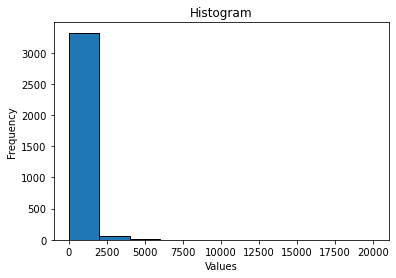

In [34]:
plt.hist(data['TotalHours'] , bins=10, edgecolor='black')
# Add labels and title
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Histogram')

# Show the histogram
plt.show()


In [42]:
#checking the league level of players with TotalHours> 5000
#Keeping these as there can be players who play a lot but still cant reach the high level
data[(data['TotalHours']> 5000) & (data['LeagueIndex'] < 5)]

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
10,83,3,16.0,16.0,6000.0,153.8010,0.001677,0.000319,4,0.000000,0.000822,0.003772,23.4107,48.0711,7.0044,24,0.001593,7,0.000000,0.000017
1978,5610,4,22.0,10.0,18000.0,152.2374,0.011983,0.000206,1,0.000016,0.000364,0.003351,52.1896,63.9811,4.9575,19,0.000680,5,0.000000,0.000000
2216,6242,3,24.0,20.0,10260.0,76.5852,0.000780,0.000197,0,0.000063,0.000316,0.002438,42.9480,84.6340,5.9107,27,0.000450,10,0.000246,0.000358
3253,9055,3,19.0,20.0,6000.0,102.0114,0.002045,0.000317,5,0.000044,0.000555,0.003032,62.5423,67.3140,6.3605,24,0.001410,6,0.000238,0.001948


/Users/krishnabarfiwala/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='TotalHours', ylabel='Density'>

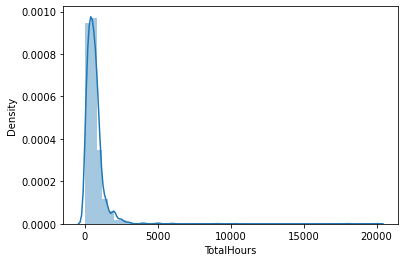

In [33]:
sns.distplot(data['TotalHours'])

In [43]:
data.describe()

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
count,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000,3391.00000,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000,3391.000000
mean,4805.232085,4.182247,21.645372,15.824648,658.110282,116.902053,0.004285,0.000373,4.36184,0.000098,0.000387,0.003461,40.379283,63.768850,5.271970,22.118549,0.001031,6.531996,0.000059,0.000142
std,2720.957472,1.517195,4.173133,11.380096,740.107338,51.793948,0.005269,0.000225,2.35888,0.000166,0.000377,0.000992,17.155157,19.230883,1.495214,7.423640,0.000519,1.856208,0.000111,0.000265
min,52.000000,1.000000,16.000000,0.000000,3.000000,22.059600,0.000000,0.000000,0.00000,0.000000,0.000000,0.000679,6.666700,24.093600,2.038900,5.000000,0.000077,2.000000,0.000000,0.000000
25%,2464.500000,3.000000,19.000000,8.000000,300.000000,79.820400,0.001258,0.000204,3.00000,0.000000,0.000140,0.002753,28.968500,50.467400,4.271900,17.000000,0.000683,5.000000,0.000000,0.000000
50%,4874.000000,4.000000,21.000000,12.000000,500.000000,107.959800,0.002496,0.000352,4.00000,0.000040,0.000281,0.003394,36.774200,60.979200,5.093600,22.000000,0.000905,6.000000,0.000000,0.000020
75%,7113.000000,5.000000,24.000000,20.000000,800.000000,142.598100,0.005110,0.000499,6.00000,0.000118,0.000514,0.004023,48.293850,73.710350,6.033200,27.000000,0.001258,8.000000,0.000086,0.000180
max,10095.000000,8.000000,44.000000,112.000000,20000.000000,389.831400,0.043088,0.001752,10.00000,0.003019,0.004041,0.007971,237.142900,176.372100,18.558100,58.000000,0.005149,13.000000,0.000902,0.003084


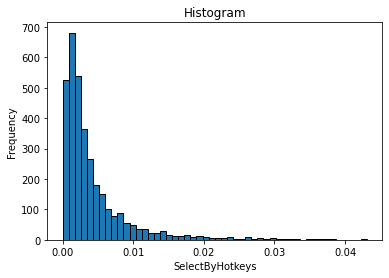

In [46]:
plt.hist(data['SelectByHotkeys'] , bins=50, edgecolor='black')
plt.xlabel('SelectByHotkeys')
plt.ylabel('Frequency')
plt.title('Histogram')
plt.show()

#It is possible that the selection of any hotkeys is 0 per timestamp


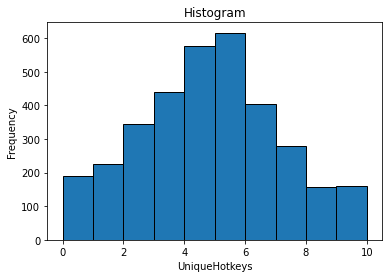

In [49]:
plt.hist(data['UniqueHotkeys'] , bins=10, edgecolor='black')
plt.xlabel('UniqueHotkeys')
plt.ylabel('Frequency')
plt.title('Histogram')
plt.show()


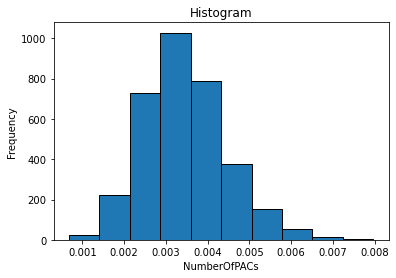

In [50]:
plt.hist(data['NumberOfPACs'] , bins=10, edgecolor='black')
plt.xlabel('NumberOfPACs')
plt.ylabel('Frequency')
plt.title('Histogram')
plt.show()

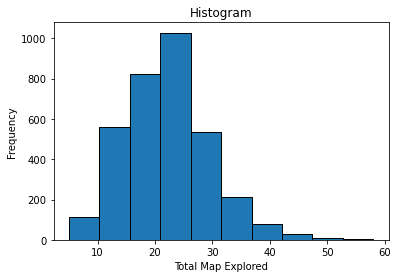

In [51]:
plt.hist(data['TotalMapExplored'] , bins=10, edgecolor='black')
plt.xlabel('Total Map Explored')
plt.ylabel('Frequency')
plt.title('Histogram')
plt.show()

#which shows 0 is v rare and not possible 

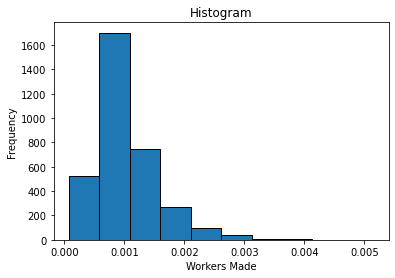

In [52]:
plt.hist(data['WorkersMade'] , bins=10, edgecolor='black')
plt.xlabel('Workers Made')
plt.ylabel('Frequency')
plt.title('Histogram')
plt.show()

In [53]:
#Normality check
from scipy.stats import shapiro
for column in data.columns:
    stat, p_value = shapiro((data[column]))
    print(f"Column: {column}, Shapiro-Wilk test statistic: {stat:.4f}, p-value: {p_value:.4f}")

Column: GameID, Shapiro-Wilk test statistic: 0.9612, p-value: 0.0000
Column: LeagueIndex, Shapiro-Wilk test statistic: 0.9469, p-value: 0.0000
Column: Age, Shapiro-Wilk test statistic: 0.9218, p-value: 0.0000
Column: HoursPerWeek, Shapiro-Wilk test statistic: 0.8410, p-value: 0.0000
Column: TotalHours, Shapiro-Wilk test statistic: 0.5024, p-value: 0.0000
Column: APM, Shapiro-Wilk test statistic: 0.9292, p-value: 0.0000
Column: SelectByHotkeys, Shapiro-Wilk test statistic: 0.6772, p-value: 0.0000
Column: AssignToHotkeys, Shapiro-Wilk test statistic: 0.9378, p-value: 0.0000
Column: UniqueHotkeys, Shapiro-Wilk test statistic: 0.9711, p-value: 0.0000
Column: MinimapAttacks, Shapiro-Wilk test statistic: 0.5856, p-value: 0.0000
Column: MinimapRightClicks, Shapiro-Wilk test statistic: 0.7848, p-value: 0.0000
Column: NumberOfPACs, Shapiro-Wilk test statistic: 0.9835, p-value: 0.0000
Column: GapBetweenPACs, Shapiro-Wilk test statistic: 0.8870, p-value: 0.0000
Column: ActionLatency, Shapiro-Wilk

In [54]:
#Normality check for log transformed data
from scipy.stats import shapiro
for column in data.columns:
    stat, p_value = shapiro(np.log(data[column]))
    print(f"Column: {column}, Shapiro-Wilk test statistic: {stat:.4f}, p-value: {p_value:.4f}")

Column: GameID, Shapiro-Wilk test statistic: 0.8492, p-value: 0.0000
Column: LeagueIndex, Shapiro-Wilk test statistic: 0.8605, p-value: 0.0000
Column: Age, Shapiro-Wilk test statistic: 0.9665, p-value: 0.0000
Column: HoursPerWeek, Shapiro-Wilk test statistic: nan, p-value: 1.0000
Column: TotalHours, Shapiro-Wilk test statistic: 0.9500, p-value: 0.0000
Column: APM, Shapiro-Wilk test statistic: 0.9982, p-value: 0.0008
Column: SelectByHotkeys, Shapiro-Wilk test statistic: nan, p-value: 1.0000
Column: AssignToHotkeys, Shapiro-Wilk test statistic: nan, p-value: 1.0000
Column: UniqueHotkeys, Shapiro-Wilk test statistic: nan, p-value: 1.0000
Column: MinimapAttacks, Shapiro-Wilk test statistic: nan, p-value: 1.0000
Column: MinimapRightClicks, Shapiro-Wilk test statistic: nan, p-value: 1.0000
Column: NumberOfPACs, Shapiro-Wilk test statistic: 0.9876, p-value: 0.0000
Column: GapBetweenPACs, Shapiro-Wilk test statistic: 0.9979, p-value: 0.0002
Column: ActionLatency, Shapiro-Wilk test statistic: 0

/Users/krishnabarfiwala/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [ ]:
#The above tests shows for the following columns, the data is normally distributed. 
##For HoursPerWeek, SelectByHotkeys, AssignToHotkeys, UniqueHotkeys, MinimapAttacks, MinimapRightClicks,
## ComplexUnitsMade, ComplexAbilitiesUsed

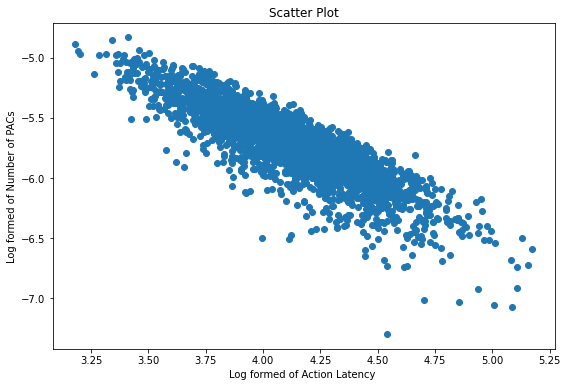

In [120]:
#used for interpreting the trend
plt.figure(figsize=(9,6))
plt.scatter(np.log(data.ActionLatency), np.log(data.NumberOfPACs))
plt.xlabel('Log formed of Action Latency ')
plt.ylabel('Log formed of Number of PACs')
plt.title('Scatter Plot')
# Display the plot
plt.show()

#conclusion: inversly proportional

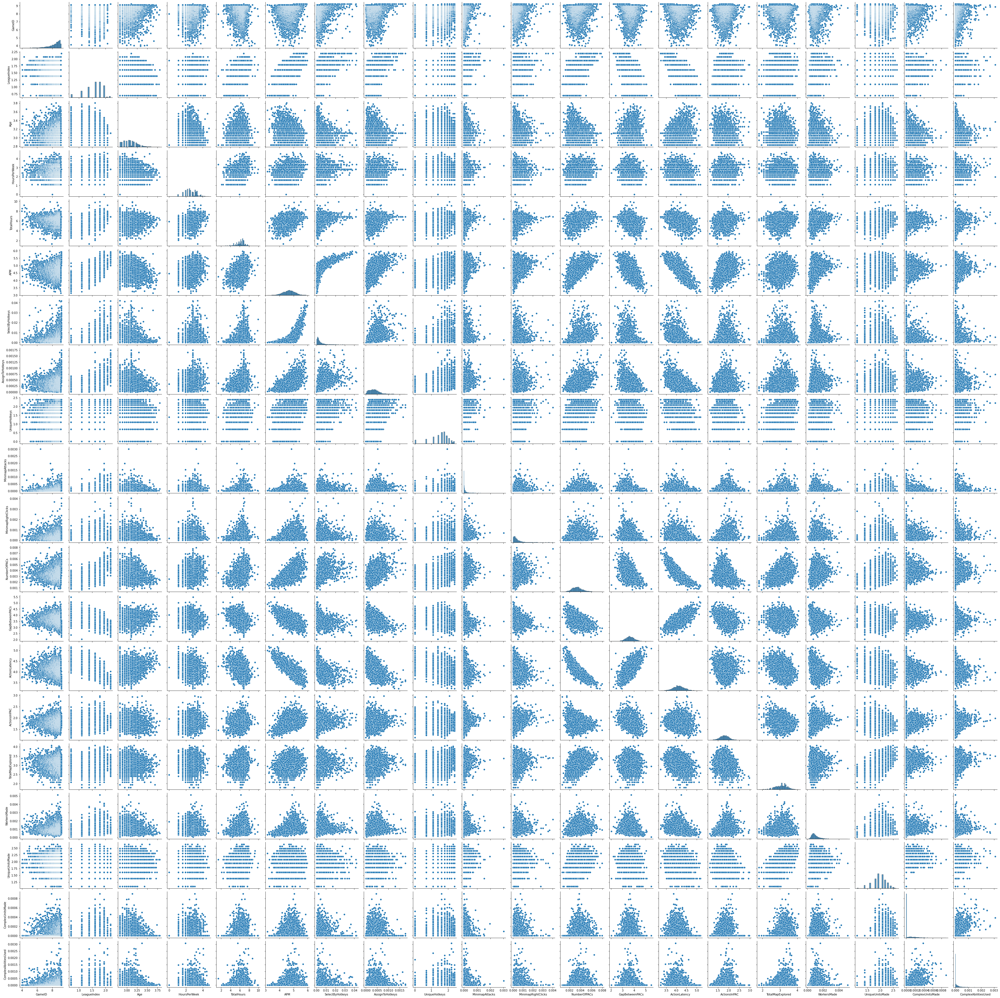

In [63]:
#tranforming non normal data and ploting prob plot
from scipy import stats 

log_transformed_df = np.log1p(data)
sns.pairplot(log_transformed_df)
plt.show()
#stats.shapiro(data.APM)
#stats.kstest(data.APM,'norm')

In [66]:
#For non normalize data: standardizing 
nonnormalcol= ['LeagueIndex', 'Age','TotalHours','APM','NumberOfPACs','GapBetweenPACs','ActionLatency',
               'ActionsInPAC','TotalMapExplored','WorkersMade','UniqueUnitsMade']
nonnormaldf= np.log(data[nonnormalcol])
nonnormaldf.head()

,LeagueIndex,Age,TotalHours,APM,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade
0,1.609438,3.295837,8.006368,4.967853,-5.328975,3.486387,3.710330,1.558313,3.332205,-6.573715,1.791759
1,1.609438,3.135494,8.517193,4.861611,-5.447499,3.494062,3.745860,1.577617,3.091042,-6.730865,1.609438
2,1.386294,3.401197,5.298317,4.247941,-5.834203,3.798798,4.322208,1.396987,3.091042,-7.202731,1.791759
3,1.098612,2.944439,5.991465,4.678436,-5.577357,3.374864,3.984068,1.592393,2.944439,-7.760602,1.945910
4,1.098612,3.465736,6.214608,4.811296,-6.045583,3.121858,4.128445,2.237940,2.708050,-6.746913,1.386294


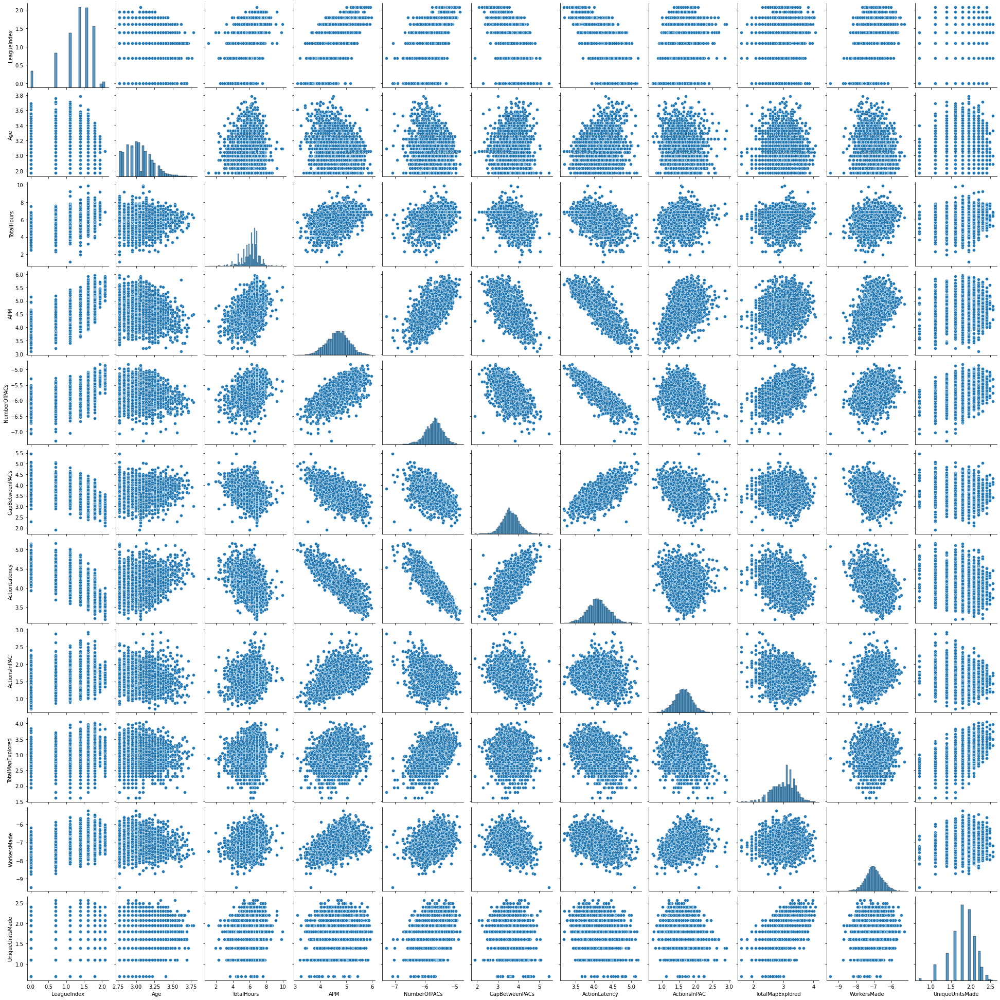

In [70]:
import statsmodels.api as sm
sns.pairplot(nonnormaldf)

plt.show()

One way ANOVA: 
Is there any difference in the mean of the APM for different LeagueIndexes?

In [74]:
data.groupby("LeagueIndex").mean() # Average clicks per minute

,GameID,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
LeagueIndex,,,,,,,,,,,,,,,,,,,
1,4427.359281,22.724551,13.125749,264.191617,59.539277,0.001081,0.000185,3.215569,0.000028,0.000208,0.002363,65.654987,95.404977,4.548287,18.730539,0.000626,5.826347,0.000015,0.000042
2,4668.334294,22.155620,13.296830,331.409222,74.780917,0.001536,0.000222,3.351585,0.000045,0.000276,0.002650,53.788886,81.270053,5.005949,19.824207,0.000801,6.074928,0.000024,0.000076
3,4725.052441,22.050633,13.949367,493.792043,89.971260,0.002188,0.000282,3.687161,0.000056,0.000332,0.002976,46.143882,73.697301,5.163282,20.506329,0.000919,6.368897,0.000045,0.000117
4,4715.130703,21.981504,14.022195,588.006165,105.847166,0.003150,0.000340,3.971640,0.000075,0.000368,0.003310,41.041426,64.793765,5.236971,22.019729,0.001006,6.573366,0.000065,0.000138
5,4704.237267,21.366460,16.173456,782.088895,131.334502,0.004957,0.000414,4.699379,0.000115,0.000426,0.003742,34.734685,56.109800,5.467554,23.068323,0.001168,6.700621,0.000076,0.000176
6,4845.728155,20.686084,20.679612,947.799353,158.356269,0.007409,0.000512,5.512945,0.000155,0.000471,0.004229,30.236025,48.992929,5.471894,24.257282,0.001210,6.859223,0.000077,0.000181
7,4683.771429,21.171429,31.714286,1581.028571,189.555686,0.009418,0.000723,6.771429,0.000340,0.000570,0.005111,22.978160,40.342903,5.226089,28.028571,0.001238,7.028571,0.000082,0.000267
8,10051.509091,21.281001,15.631811,944.280118,267.341236,0.020981,0.000937,7.345455,0.000376,0.000831,0.005237,18.969773,35.390153,5.676727,22.854545,0.001077,6.127273,0.000026,0.000135


In [76]:
import scipy.stats as stats

stats.f_oneway(data['APM'][data['LeagueIndex'] == '1'], data['APM'][data['LeagueIndex'] == '2'], 
               data['APM'][data['LeagueIndex'] == '3'], data['APM'][data['LeagueIndex'] == '4'],
               data['APM'][data['LeagueIndex'] == '5'], data['APM'][data['LeagueIndex'] == '6'],
               data['APM'][data['LeagueIndex'] == '7'], data['APM'][data['LeagueIndex'] == '8']
              )

F_onewayResult(statistic=nan, pvalue=nan)

Text(0.5, 1.0, 'correlation map')

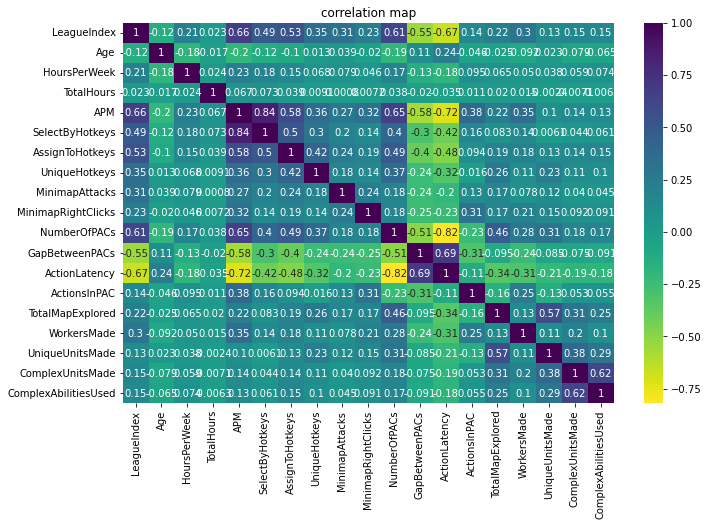

In [72]:
plt.figure(figsize=(11,7))
sns.heatmap(data.drop(["GameID"], axis=1).corr(),annot = True, cmap='viridis_r')
plt.title('correlation map')

#We can see that there is high correlation between the ActionLatency and Number of PACs

High negative correlation between ActionLatency and NumberOfPACs, we remove one variable. 

<AxesSubplot:xlabel='ActionLatency', ylabel='Density'>

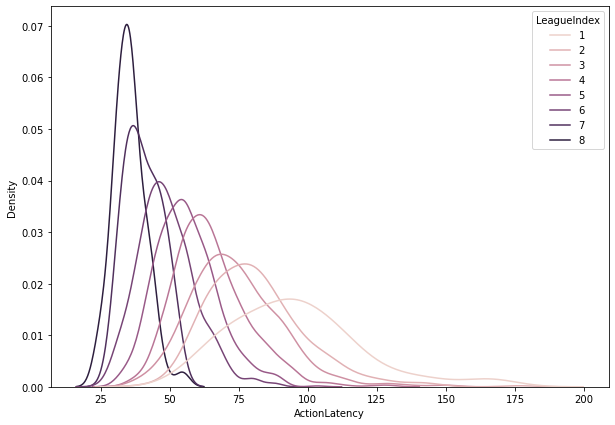

In [22]:
#ActionLatency 
plt.figure(figsize=(10, 7))
sns.kdeplot(data=data, x="ActionLatency", hue = 'LeagueIndex', common_norm = False, warn_singular=False)

<AxesSubplot:xlabel='NumberOfPACs', ylabel='Density'>

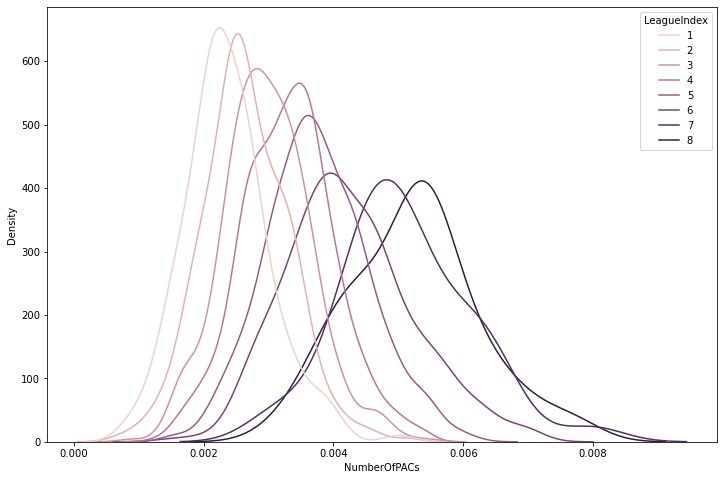

In [23]:
plt.figure(figsize=(12, 8))
sns.kdeplot(data=data, x="NumberOfPACs", hue = 'LeagueIndex', common_norm = False, warn_singular=False)

Dropping ActionLatency for modeling since a high correlation, the mean for NumberofPACs is far away hence comparable

In [83]:
df= data.drop(["ActionLatency"], axis=1)

<AxesSubplot:xlabel='SelectByHotkeys', ylabel='Density'>

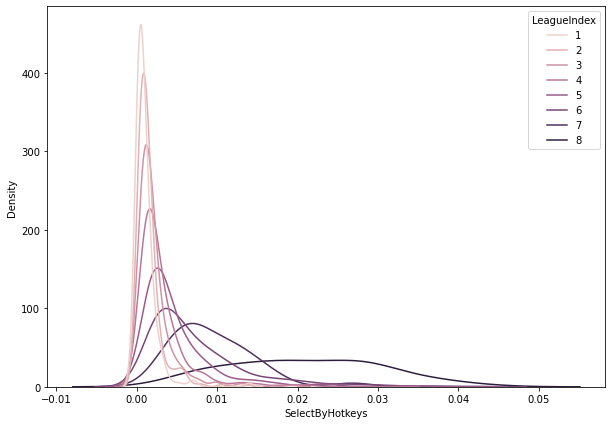

In [28]:
plt.figure(figsize=(10, 7))
sns.kdeplot(data=data, x="SelectByHotkeys", hue = 'LeagueIndex', common_norm = False, warn_singular=False)

<AxesSubplot:xlabel='APM', ylabel='Count'>

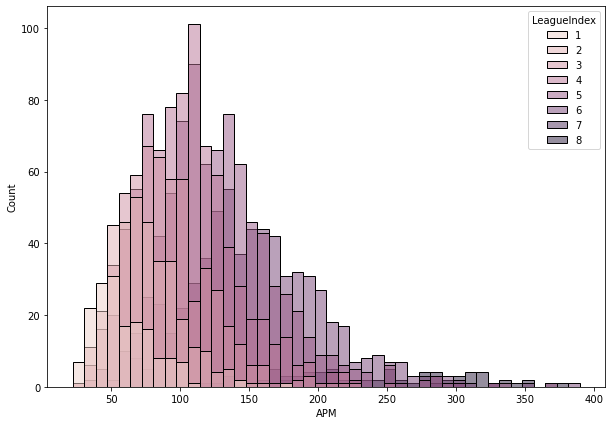

In [57]:
plt.figure(figsize=(10, 7))
sns.histplot(data=data, x="APM", hue = 'LeagueIndex',color='green', fill=True, common_norm = False)

<AxesSubplot:xlabel='APM', ylabel='Density'>

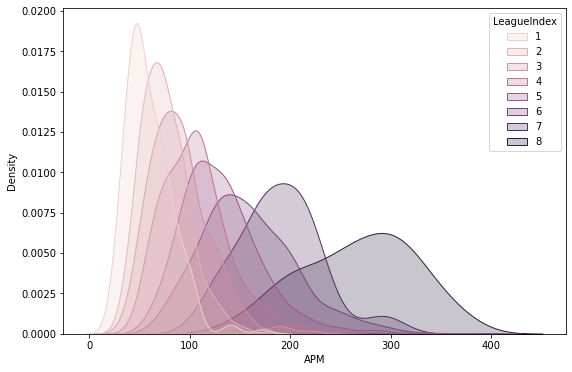

In [59]:
plt.figure(figsize=(9, 6))
sns.kdeplot(data=data, x="APM", hue = 'LeagueIndex', common_norm = False,fill=True, warn_singular=False)

/Users/krishnabarfiwala/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/Users/krishnabarfiwala/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


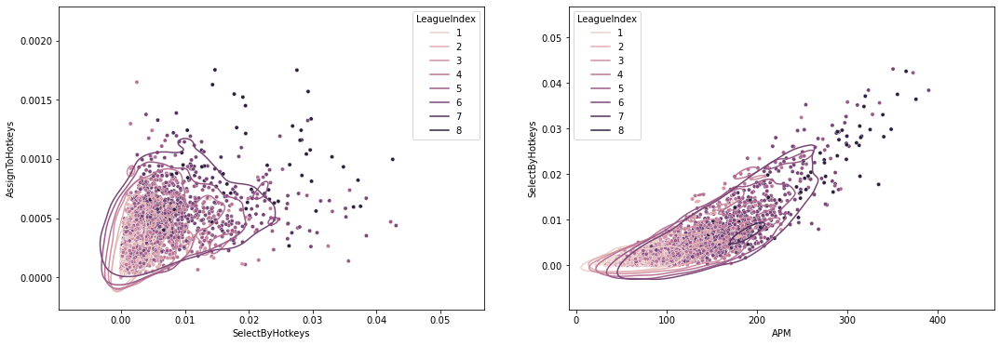

In [65]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.scatterplot(data=data, x="SelectByHotkeys", y="AssignToHotkeys", hue='LeagueIndex', size=0.01, ax=axes[0])
sns.kdeplot(data=data, x="SelectByHotkeys", y="AssignToHotkeys", hue='LeagueIndex', levels=[0.05], ax=axes[0])

sns.scatterplot(data=data, x="APM", y="SelectByHotkeys", hue='LeagueIndex', size=0.01, ax=axes[1])
sns.kdeplot(data=data, x="APM", y="SelectByHotkeys", hue='LeagueIndex', levels=[0.05], ax=axes[1])

plt.show()


<AxesSubplot:title={'center':'Workers Made versus APMs'}, xlabel='APM', ylabel='WorkersMade'>

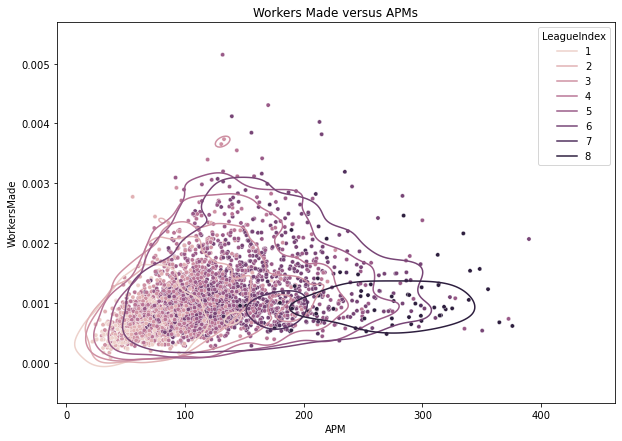

In [70]:
plt.figure(figsize=(10, 7))
sns.scatterplot(data=data, x="APM", y="WorkersMade", hue = 'LeagueIndex', size = 0.01).set(title='Workers Made versus APMs')
sns.kdeplot(data=data, x="APM", y="WorkersMade", hue = 'LeagueIndex', levels = [0.05])

**Modeling**

Random forest

In [100]:
# Machine Learning Libraries
import sklearn
from sklearn import tree
from sklearn.svm import SVC
from sklearn.metrics import roc_curve
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report
from mlxtend.classifier import StackingCVClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold, cross_validate
from sklearn.metrics import recall_score, f1_score, roc_auc_score
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.model_selection import RepeatedStratifiedKFold, StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score

In [104]:
labels = df['LeagueIndex']

In [105]:
# Splitting Train and Test Data

X_raw,X_test,y_raw,y_test  = train_test_split(df,
                                              labels,
                                              test_size=0.1,
                                              stratify = labels,
                                              random_state = 42)

In [107]:
# Stratified Cross Validation Splitting

sss = StratifiedKFold(n_splits=5,shuffle=False)

for train_index, test_index in sss.split(X_raw,y_raw):
    
    print("Train:", train_index, "Test:", test_index)
    X_train_sm, X_val_sm = X_raw.iloc[train_index], X_raw.iloc[test_index]
    y_train_sm, y_val_sm = y_raw.iloc[train_index], y_raw.iloc[test_index]

# Check the Distribution of the labels


# Turn into an array
X_train_sm = X_train_sm.values
X_val_sm = X_val_sm.values
y_train_sm = y_train_sm.values
y_val_sm = y_val_sm.values

# See if both the train and test label distribution are similarly distributed
train_unique_label, train_counts_label = np.unique(y_train_sm, return_counts=True)
test_unique_label, test_counts_label = np.unique(y_val_sm, return_counts=True)
print('-' * 84)

print('Label Distributions: \n')
print(train_counts_label/ len(y_train_sm))
print(test_counts_label/ len(y_val_sm))

Train: [ 408  448  451 ... 3048 3049 3050] Test: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 2

In [116]:
accuracy_lst_rfc = []
precision_lst_rfc = []
recall_lst_rfc = []
f1_lst_rfc = []
auc_lst_rfc = []

rfc_sm = RandomForestClassifier()
#rfc_params = {}
rfc_params = {'max_features' : ['auto'],
              'random_state' : [42],
              'class_weight' : ['balanced'],
              'criterion' : ['gini'],
              'bootstrap' : [True,False]
#               'max_features' : ['auto', 'sqrt', 'log2'],
#               'random_state' : [42],
#               'class_weight' : ['balanced','balanced_subsample'],
#               'criterion' : ['gini', 'entropy'],
#               'bootstrap' : [True,False]
             }
    
    
rand_rfc = RandomizedSearchCV(rfc_sm, rfc_params, n_iter=4)


for train, val in sss.split(X_train_sm, y_train_sm):
#     pipeline_rfc = imbalanced_make_pipeline(SMOTE(sampling_strategy='minority'), rand_rfc) # SMOTE happens during Cross Validation not before..
    model_rfc = rand_rfc.fit(X_train_sm, y_train_sm)
    best_est_rfc = rand_rfc.best_estimator_
    prediction_rfc = best_est_rfc.predict(X_train_sm[val])
    
    accuracy_lst_rfc.append(pipeline_rfc.score(X_train_sm[val], y_train_sm[val]))
    precision_lst_rfc.append(precision_score(y_train_sm[val], prediction_rfc,average='weighted'))
   
    recall_lst_rfc.append(recall_score(y_train_sm[val], prediction_rfc, average='weighted'))
    f1_lst_rfc.append(f1_score(y_train_sm[val], prediction_rfc, average='weighted'))
#     auc_lst_rfc.append(roc_auc_score(y_train_sm[val], prediction_rfc, average='weighted'))
    
print('---' * 45)
print('')
print("accuracy: {}".format(np.mean(accuracy_lst_rfc)))
print("precision: {}".format(np.mean(precision_lst_rfc)))
print("recall: {}".format(np.mean(recall_lst_rfc)))
print("f1: {}".format(np.mean(f1_lst_rfc)))
print('---' * 45)

---------------------------------------------------------------------------------------------------------------------------------------

accuracy: 1.0
precision: 1.0
recall: 1.0
f1: 1.0
---------------------------------------------------------------------------------------------------------------------------------------


In [ ]:
smote_prediction_rfc = best_est_rfc.predict(X_val_sm)
print(classification_report(y_val_sm, smote_prediction_rfc, target_names=label))

In [ ]:
# Plotting Precision-Recall curve

y_score_rfc = best_est_rfc.predict(X_val_sm)

average_precision_rfc = average_precision_score(y_val_sm, y_score_rfc)

fig = plt.figure(figsize=(12,6))

precision_rfc, recall_rfc, _ = precision_recall_curve(y_val_sm, y_score_rfc)

plt.step(recall_rfc, precision_rfc, color='r', alpha=0.2,
         where='post')
plt.fill_between(recall_rfc, precision_rfc, step='post', alpha=0.2,
                 color='#F59B00')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('OverSampling Precision-Recall curve: \n Average Precision-Recall Score ={0:0.2f}'.format(
          average_precision_rfc), fontsize=15)

plt.show()

In [74]:
#importing libraries 
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

In [123]:
#importing logistic regression libraries  
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

In [131]:
#renaming income column variable as 0 and 1
#df['LeagueIndex'].unique()
df.drop(['LeagueIndex', 'GameID'], axis=1, inplace = True)

In [132]:
df

,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,27.000000,10.000000,3000.000000,143.7180,0.003515,0.000220,7,0.000110,0.000392,0.004849,32.6677,4.7508,28,0.001397,6,0.000000,0.000000
1,23.000000,10.000000,5000.000000,129.2322,0.003304,0.000259,4,0.000294,0.000432,0.004307,32.9194,4.8434,22,0.001193,5,0.000000,0.000208
2,30.000000,10.000000,200.000000,69.9612,0.001101,0.000336,4,0.000294,0.000461,0.002926,44.6475,4.0430,22,0.000745,6,0.000000,0.000189
3,19.000000,20.000000,400.000000,107.6016,0.001034,0.000213,1,0.000053,0.000543,0.003783,29.2203,4.9155,19,0.000426,7,0.000000,0.000384
4,32.000000,10.000000,500.000000,122.8908,0.001136,0.000327,2,0.000000,0.001329,0.002368,22.6885,9.3740,15,0.001174,4,0.000000,0.000019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3390,21.281001,15.631811,944.280118,259.6296,0.020425,0.000743,9,0.000621,0.000146,0.004555,18.6059,6.2754,46,0.000877,5,0.000000,0.000000
3391,21.281001,15.631811,944.280118,314.6700,0.028043,0.001157,10,0.000246,0.001083,0.004259,14.3023,7.1965,16,0.000788,4,0.000000,0.000000
3392,21.281001,15.631811,944.280118,299.4282,0.028341,0.000860,7,0.000338,0.000169,0.004439,12.4028,6.3979,19,0.001260,4,0.000000,0.000000
3393,21.281001,15.631811,944.280118,375.8664,0.036436,0.000594,5,0.000204,0.000780,0.004346,11.6910,7.9615,15,0.000613,6,0.000000,0.000631


Standardizing the data

In [137]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(df)
df = scaler.transform(df)
df

array([[0.39285714, 0.08928571, 0.14987248, ..., 0.36363636, 0.        ,
        0.        ],
       [0.25      , 0.08928571, 0.24988748, ..., 0.27272727, 0.        ,
        0.067312  ],
       [0.5       , 0.08928571, 0.00985148, ..., 0.36363636, 0.        ,
        0.06121218],
       ...,
       [0.1886072 , 0.13956975, 0.04707107, ..., 0.18181818, 0.        ,
        0.        ],
       [0.1886072 , 0.13956975, 0.04707107, ..., 0.36363636, 0.        ,
        0.20475727],
       [0.1886072 , 0.13956975, 0.04707107, ..., 0.45454545, 0.50635139,
        0.29026494]])

In [143]:
df= pd.DataFrame(df)

In [160]:
columns.remove('ActionLatency')
columns

['Age',
 'HoursPerWeek',
 'TotalHours',
 'APM',
 'SelectByHotkeys',
 'AssignToHotkeys',
 'UniqueHotkeys',
 'MinimapAttacks',
 'MinimapRightClicks',
 'NumberOfPACs',
 'GapBetweenPACs',
 'ActionsInPAC',
 'TotalMapExplored',
 'WorkersMade',
 'UniqueUnitsMade',
 'ComplexUnitsMade',
 'ComplexAbilitiesUsed']

In [161]:
df.columns= columns

In [162]:
df

,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,0.392857,0.089286,0.149872,0.330799,0.081580,0.125384,0.7,0.036382,0.097089,0.571893,0.112814,0.164167,0.433962,0.260161,0.363636,0.000000,0.000000
1,0.250000,0.089286,0.249887,0.291411,0.076675,0.148079,0.4,0.097391,0.107017,0.497565,0.113906,0.169772,0.320755,0.220120,0.272727,0.000000,0.067312
2,0.500000,0.089286,0.009851,0.130248,0.025554,0.191515,0.4,0.097248,0.114188,0.308128,0.164793,0.121319,0.320755,0.131610,0.363636,0.000000,0.061212
3,0.107143,0.178571,0.019853,0.232595,0.023987,0.121620,0.1,0.017645,0.134480,0.425632,0.097857,0.174137,0.264151,0.068848,0.454545,0.000000,0.124390
4,0.571429,0.089286,0.024854,0.274168,0.026365,0.186810,0.2,0.000000,0.328786,0.231676,0.069516,0.444035,0.188679,0.216374,0.181818,0.000000,0.006244
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3386,0.188607,0.139570,0.047071,0.645971,0.474033,0.424018,0.9,0.205728,0.036170,0.531595,0.051802,0.256459,0.773585,0.157711,0.272727,0.000000,0.000000
3387,0.188607,0.139570,0.047071,0.795630,0.650829,0.660419,1.0,0.081544,0.268094,0.491029,0.033130,0.312219,0.207547,0.140151,0.181818,0.000000,0.000000
3388,0.188607,0.139570,0.047071,0.754187,0.657742,0.490937,0.7,0.111925,0.041816,0.515704,0.024888,0.263875,0.264151,0.233151,0.181818,0.000000,0.000000
3389,0.188607,0.139570,0.047071,0.962028,0.845609,0.339156,0.5,0.067657,0.193024,0.502845,0.021800,0.358528,0.188679,0.105644,0.363636,0.000000,0.204757


In [163]:
df_y= data['LeagueIndex']

In [164]:
#splitting data in train and test for logistic regression 
X_train, X_test, y_train, y_test = train_test_split(df, df_y, test_size=0.3, random_state=0)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression()

In [165]:
#predicting the test dataset
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.39


In [166]:
#making confusion matrix
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[  1  29  17  13   0   0   0   0]
 [  0  31  25  42   3   0   0   0]
 [  0  12  33  93  28   0   0   0]
 [  0   5  21 134  70  10   0   0]
 [  0   1   7  74  99  39   0   1]
 [  0   0   2  20  88  89   0   0]
 [  0   0   0   0   3   9   0   0]
 [  0   0   0   0   0  12   0   7]]


In [167]:
#finding classification matrix  
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       1.00      0.02      0.03        60
           2       0.40      0.31      0.35       101
           3       0.31      0.20      0.24       166
           4       0.36      0.56      0.44       240
           5       0.34      0.45      0.39       221
           6       0.56      0.45      0.50       199
           7       0.00      0.00      0.00        12
           8       0.88      0.37      0.52        19

    accuracy                           0.39      1018
   macro avg       0.48      0.29      0.31      1018
weighted avg       0.43      0.39      0.37      1018



NaiveBayes

In [169]:
from sklearn.naive_bayes import GaussianNB
# instantiate the model
gnb = GaussianNB()
X_train, X_test, y_train, y_test = train_test_split(df, df_y, test_size=0.3, random_state=0)

# fit the model
gnb.fit(X_train, y_train)

GaussianNB()

In [170]:
#predicting the test dataset
y_pred = gnb.predict(X_test)
y_pred

array([1, 5, 4, ..., 6, 5, 1])

In [171]:
#printing the accuracy score  
from sklearn.metrics import accuracy_score
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score: 0.3212


In [172]:
#predicting train dataset of independent variables
y_pred_train = gnb.predict(X_train)
y_pred_train

array([5, 3, 2, ..., 7, 6, 6])

In [173]:
#displaying accuracy score
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train)))

Training-set accuracy score: 0.3519


In [174]:
#finding score of train and test dataset
print('Training set score: {:.4f}'.format(gnb.score(X_train, y_train)))
print('Test set score: {:.4f}'.format(gnb.score(X_test, y_test)))

Training set score: 0.3519
Test set score: 0.3212


In [175]:
y_test.value_counts()

4    240
5    221
6    199
3    166
2    101
1     60
8     19
7     12
Name: LeagueIndex, dtype: int64